# Installations

In [ ]:
!pip install datasets

In [ ]:
!pip install transformers

In [ ]:
!pip install shap

# Imports

In [4]:
from transformers import AutoImageProcessor, Swinv2ForImageClassification
from datasets import load_dataset
import shap
from PIL import Image
import numpy as np
import pandas as pd
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
%matplotlib inline

# ImageNet50

In [5]:
X, y = shap.datasets.imagenet50()

In [6]:
path = "/content/drive/MyDrive/ImageNet50" # change path

for i in range(50):
  im = Image.fromarray(np.uint8(X[i]))
  im.save(f"{path}/im_{i}.png")

# Setting up preprocessor and model

In [ ]:
# ref: https://huggingface.co/docs/transformers/model_doc/swinv2
# small model

# image_processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")
# model = Swinv2ForImageClassification.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")

# microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft
# base model

# image_processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft")
# model = Swinv2ForImageClassification.from_pretrained("microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft")

# https://huggingface.co/microsoft/swinv2-large-patch4-window12-192-22k
# large model

image_processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-large-patch4-window12-192-22k")
model = Swinv2ForImageClassification.from_pretrained("microsoft/swinv2-large-patch4-window12-192-22k")

In [10]:
labels_df = pd.read_excel("/content/ImageNet22k.xlsx", header=None)
labels = labels_df.to_numpy()

In [11]:
labels_df.shape, labels.shape

((21843, 1), (21843, 1))

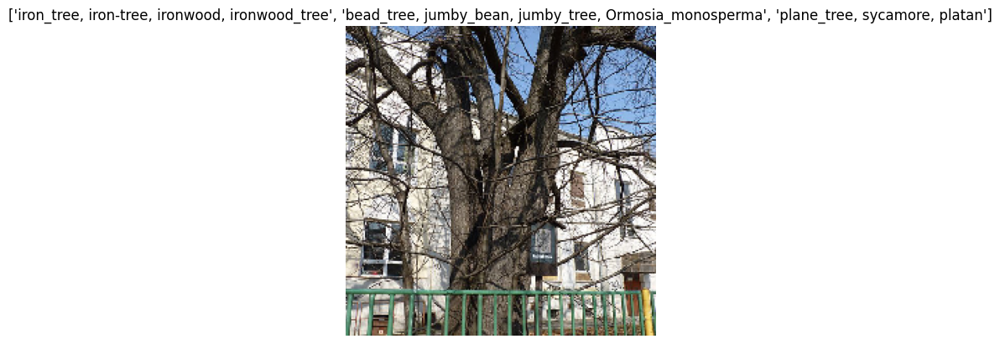

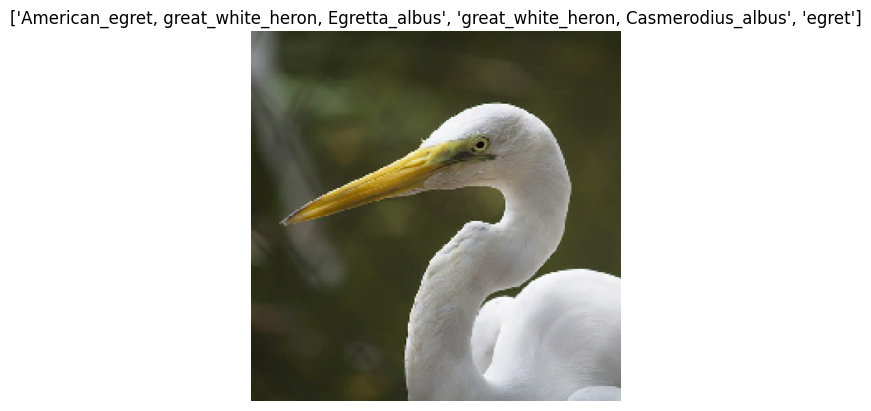

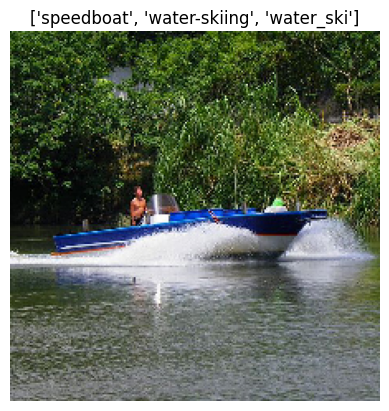

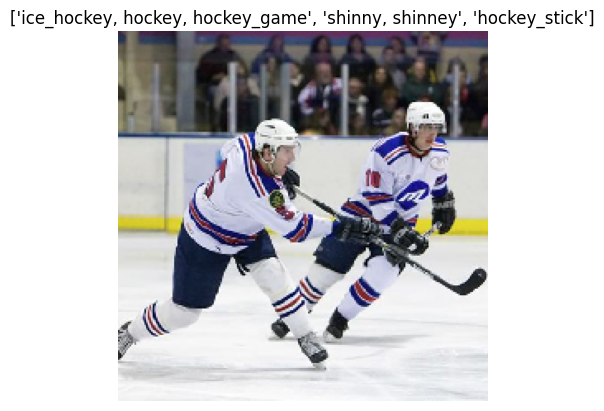

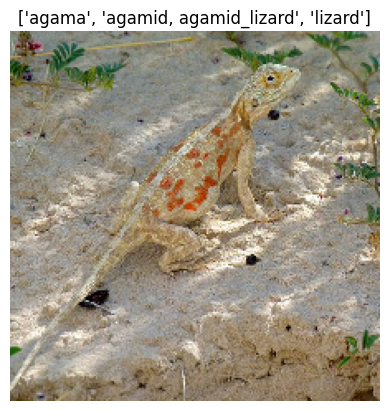

...

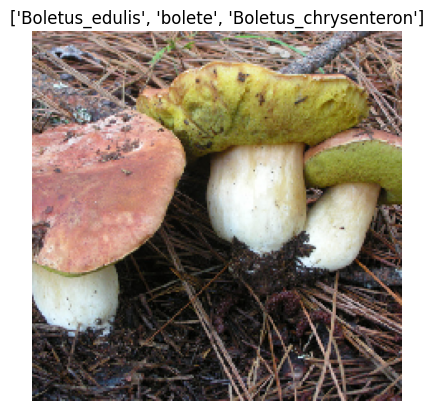

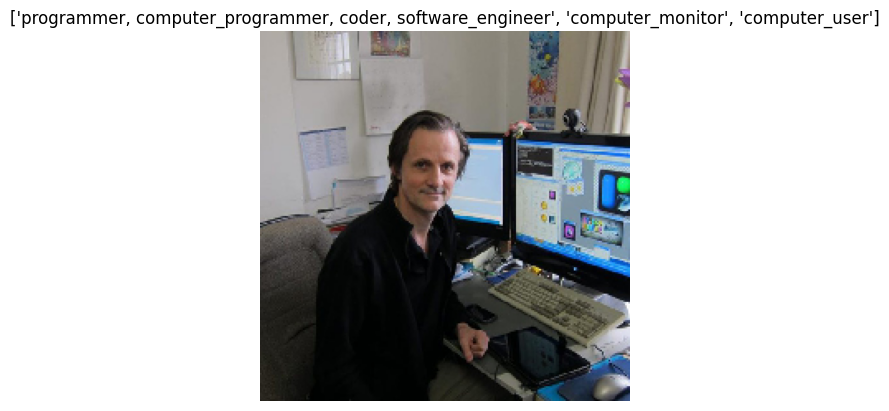

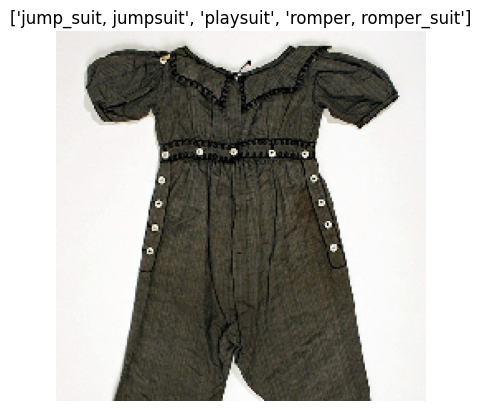

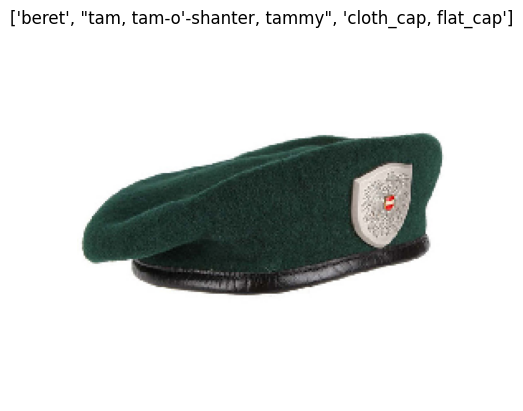

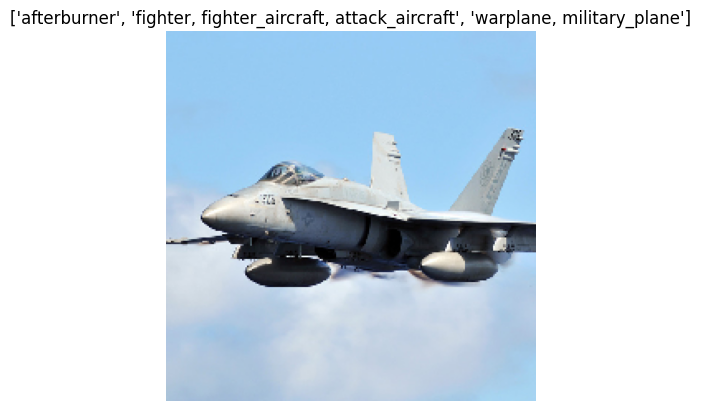

In [12]:
# preds = []
predictions_dict = {}

for i in range(50):
  im_path = path + f"/im_{i}.png"
  img = Image.open(im_path).convert('RGB')
  # print(type(img))

  inputs = image_processor(img, return_tensors="pt")

  with torch.no_grad():
    logits = model(**inputs).logits

  predicted_label = logits.argmax(-1).item()

  top_3 = torch.topk(logits.flatten(), 3).indices
  
  top_3_labels = [model.config.id2label[i.item()] for i in top_3]
  # p = model.config.id2label[predicted_label]
  # plt.title(p)

  top_3_labels_ = [int(i.split("_")[1]) for i in top_3_labels]
  top_3_labels = [labels[i].item() for i in top_3_labels_]

  predictions_dict[f"im_{i}.png"] = top_3_labels + top_3_labels_ # saving list of words and numerical value
  

  plt.title(top_3_labels[:3])
  plt.axis("off")
  plt.imshow(img)
  plt.savefig(f"{path}/preds22k/im_{i}.png", bbox_inches='tight')
  plt.show()

  # print(top_3_labels, top_3_labels_)

In [13]:
all_predictions_df = pd.DataFrame.from_dict(predictions_dict, orient='index',
                       columns=['prediction 1', 'prediction 2', 'prediction 3', 'int 1', 'int 2', 'int 3'])
all_predictions_df.head(10)

,prediction 1,prediction 2,prediction 3,int 1,int 2,int 3
im_0.png,"iron_tree, iron-tree, ironwood, ironwood_tree","bead_tree, jumby_bean, jumby_tree, Ormosia_mon...","plane_tree, sycamore, platan",19261,19854,20553
im_1.png,"American_egret, great_white_heron, Egretta_albus","great_white_heron, Casmerodius_albus",egret,1922,1921,1917
im_2.png,speedboat,water-skiing,water_ski,10626,47,11769
im_3.png,"ice_hockey, hockey, hockey_game","shinny, shinney",hockey_stick,110,125,7638
im_4.png,agama,"agamid, agamid_lizard",lizard,1064,1063,1024
im_5.png,pump_room,valve,"oil_refinery, petroleum_refinery",9561,11600,8863
im_6.png,mint,green_salad,"salad_green, salad_greens",13332,13262,12891
im_7.png,Barbadian,"headdress, headgear",Bahamian,14616,7542,14611
im_8.png,den,family_room,"sofa, couch, lounge",6216,6772,10544
im_9.png,Aegean_island,"harbor, harbour","seashore, coast, seacoast, sea-coast",14212,7496,14394


In [15]:
all_predictions_df.to_csv("SwinTransformer22k_Predictions.csv")

In [17]:
all_predictions_df.shape

(50, 6)